# Assignment 2: Exploratory Data Analysis and Visualization
---

In [1]:
# load libraries
library(tidyverse)
library(GGally)
library(viridis)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Loading required package: viridisLite



## 1.0 Data

The provided dataset comprises information on the 215,029 most popular public GitHub repositories, ranked by the number of stars (likes) received from other GitHub users. Each repository in the dataset has a minimum of 167 stars. The dataset contains 24 variables and is publicly accessible via Kaggle: https://www.kaggle.com/datasets/donbarbos/github-repos/data.

The data was collected using the GitHub search API which allows users to perform advanced searches across public GitHub repositories. We consider the dataset to represent a sample of popular software projects.

**Table 1** provides a description of the variables present in the dataset.

**Table 1:** Description of Variables in the GitHub Repositories Dataset.

| Name            | Description | Type        |
| -----------     | ----------- | ----------- |
| Name            | The name of the GitHub repository | Text |
| Description     | Summary of the purpose or focus of the repository | Text  |
| URL             | The unique URL or web address that links to the GitHub repository | Text  |
| Created At      | The date and time when the repository was initially created on GitHub, in ISO 8601 format | Date |
| Updated At      | The date and time of the most recent update or modification to the repository, in ISO 8601 format | Date |
| Homepage        | The URL to the homepage or landing page associated with the repository | Text |
| Size            | The size of the repository in bytes | Numerical, discrete |
| Stars           | The number of stars or likes that the repository has received from other GitHub users | Numerical, discrete |
| Forks           | The number of times the repository has been forked by other GitHub users | Numerical, discrete |
| Issues          | The total number of open issues | Numerical, discrete |
| Watchers        | The number of GitHub users who are "watching" or monitoring the repository for updates and changes | Numerical, discrete |
| Language        | The primary programming language | Categorical, nominal  |
| License         | Information about the software license using a license identifier | Categorical, nominal |
| Topics          | A list of topics or tags associated with the repository | Categorical, nominal |
| Has Issues      | A Boolean value indicating whether the repository has an issue tracker enabled. In this case, it's true, meaning it has an issue tracker | Boolean |
| Has Projects    | A Boolean value indicating whether the repository uses GitHub Projects to manage and organize tasks and work items | Boolean |
| Has Downloads   | A Boolean value indicating whether the repository offers downloadable files or assets to users | Boolean |
| Has Wiki        | A Boolean value indicating whether the repository has an associated wiki with additional documentation and information | Boolean |
| Has Pages       | A Boolean value indicating whether the repository has GitHub Pages enabled, allowing the creation of a website associated with the repository | Boolean |
| Has Discussions | A Boolean value indicating whether the repository has GitHub Discussions enabled, allowing community discussions and collaboration | Boolean |
| Is Fork         | A Boolean value indicating whether the repository is a fork of another repository. In this case, it's false, meaning it is not a fork | Boolean |
| Is Archived     | A Boolean value indicating whether the repository is archived. Archived repositories are typically read-only and are no longer actively maintained | Boolean |
| Is Template     | A Boolean value indicating whether the repository is set up as a template | Boolean |
| Default Branch  | The name of the default branch | Categorical, nominal |



## 2.0 Questions

The response variable of interest is `Stars`, which represents a measure of GitHub repository popularity based on the number of stars or likes received from other GitHub users. The main input variables of interest include `Size`, `Forks`, and `Language`. These variables will be used to investigate the following inferential questions:

1. Is GitHub repository popularity associated with the size of the repository?
2. Is GitHub repository popularity associated with the number of times the repository has been forked by other GitHub users?
3. Is GitHub repository popularity associated with the primary programming language of the repository?
4. Are there significant interactions between the input variables when considering their effect on GitHub repository popularity? 

To address these questions, we will develop a multiple linear regression model. This model will incorporate the three main input variables of interest: `Size`, `Forks`, and `Language`. Additional input variables may be included to improve the goodness of fit of the model and/or help control for potential confounding effects. The generative model will be used to assess the association between the input variables of interest and the continuous response variable, `Stars`.


## 3.0 Exploratory Data Analysis and Visualization

To begin, we read the GitHub repositories dataset from GitHub into R. The dataset, which is publicly accessible from Kaggle.com, is saved to the project's GitHub repository so that it can be easily read from the web into R.  **Table 2** provides a glimpse of the first six rows of the GitHub repositories dataset. 

The GitHub repositories dataset contains over 215,000 observations. To facilitate easier handling of the data, we opt to take a random sample of 2500 observations from the initial dataset. Subsequently, we proceed to clean and wrangle the sampled data, organizing it into a tidy format.

### 3.1 Cleaning and Wrangling Sample Data

1. We replace empty characters in column names with underscores. This practice eliminates the necessity for special handling or the use of escaping characters when referring to column names in functions.
2. From the initial set of 24 variables we exclude those that are text descriptors and cannot be reasonably interpreted as factors, specifically `Name`, `Description`, `URL`, `Homepage`, `Topics` and `Default_Branch`.

In [2]:
#---------------------------------------------------------------
# Code to load data into R
#---------------------------------------------------------------

# set random seed
set.seed(2001)

# read raw data set from GitHub
repo_raw <- read_csv("https://github.com/jburden1/STAT301_Project_Group9/raw/main/data/repositories.csv")


Rows: 215029 Columns: 24
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (8): Name, Description, URL, Homepage, Language, License, Topics, Defau...
dbl  (5): Size, Stars, Forks, Issues, Watchers
lgl  (9): Has Issues, Has Projects, Has Downloads, Has Wiki, Has Pages, Has ...
dttm (2): Created At, Updated At

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [3]:
#---------------------------------------------------------------
# Code to sample, clean, wrangle and summarize data
#---------------------------------------------------------------

repo_tidy <- repo_raw
str(repo_tidy)

# replace spaces in column names with underscores
names(repo_tidy) <- gsub(" ", "_", names(repo_tidy))

# select columns
repo_tidy <- repo_tidy %>%
    select(-Name, -Description, -URL, -Homepage, -Topics, -Default_Branch)

# remove Watchers (identical to Stars)
repo_tidy <- repo_tidy %>%
    select(-Watchers)


# summarize NA values
na_count <- repo_tidy %>%
  summarise_all(~ sum(is.na(.)))
na_count
nrow(repo_tidy)

# drop NA rows
repo_tidy <- drop_na(repo_tidy)

# convert date
end_time <- as.POSIXct("2024-03-18 12:00:00")
repo_tidy <- repo_tidy %>%
    mutate(Age_Created = as.numeric(end_time - Created_At, units = "days"),
          Age_Updated = as.numeric(end_time - Updated_At, units = "days"))

# drop date columns
repo_tidy <- repo_tidy %>%
    select(-Created_At, -Updated_At)

# Reorder columns to place 'new_column' at the front
repo_tidy <- repo_tidy %>%
  select(Age_Created, Age_Updated, everything())

# Change columns to factors
factor_columns <- (ncol(repo_tidy) - 10):ncol(repo_tidy)
repo_tidy <- repo_tidy %>%
  mutate(across(all_of(factor_columns), as.factor))

str(repo_tidy)

#Drop Is_Fork (1 Level)
repo_tidy <- repo_tidy %>%
    select(-Is_Fork)


# Summarize Language
repo_language_summary <- repo_tidy %>%
    group_by(Language) %>%
    summarize(count = n(), prop = count / nrow(repo_tidy)) %>%
    arrange(desc(count))
list_language <- repo_language_summary %>%
    filter(prop > 0.05) %>%
    select(Language) %>%
    ungroup() %>%
    pull()
list_language
repo_tidy <- repo_tidy %>%
  mutate(Language = if_else(Language %in% list_language, Language, "Other"))
repo_tidy$Language <- as.factor(repo_tidy$Language)

# Summarize License
repo_license_summary <- repo_tidy %>%
    group_by(License) %>%
    summarize(count = n(), prop = count / nrow(repo_tidy)) %>%
    arrange(desc(count))
list_license <- repo_license_summary %>%
    filter(prop > 0.05) %>%
    select(License) %>%
    ungroup() %>%
    pull()
list_license
repo_tidy <- repo_tidy %>%
  mutate(License = if_else(License %in% list_license, License, "Other"))
repo_tidy$License <- as.factor(repo_tidy$License)

str(repo_tidy)




# summarize Language
# repo_sample_summary <- repo_sample %>%
#     group_by(License) %>%
#     summarize(count = n(), prop = count / nrow(repo_sample)) %>%
#     arrange(desc(count))





# # select columns
# repo_sample_selected <- repo_sample %>%
#     select(-Name, -Description, -URL, -Homepage, -Topics, -Default_Branch)
# # head(repo_sample_selected)

# # summarize NA values
# na_count <- repo_sample_selected %>%
#   summarise_all(~ sum(is.na(.)))
# na_count

# repo_sample_summary <- repo_sample %>%
#     group_by(License) %>%
#     summarize(count = n(), prop = count / nrow(repo_sample)) %>%
#     arrange(desc(count))
# repo_sample_summary



# names(repo_sample)
# repo_sample$License <- as.factor(repo_sample$License)
# repo_sample$Default_Branch <- as.factor(repo_sample$Default_Branch)
# repo_sample$Language <- as.factor(repo_sample$Language)
# repo_sample$Topics <- as.factor(repo_sample$Topics)



# repo_sample_summary <- repo_sample %>%
#     group_by(Language) %>%
#     summarize(count = n(), prop = count / nrow(repo_sample)) %>%
#     arrange(desc(count))
    
# repo_sample_summary
# str(repo_sample)

# plot1 <- repo_sample %>%
#     ggplot(aes(x = Size, y = Stars)) +
#     geom_point() +
#     scale_y_log10() +
#     scale_x_log10()
# plot1

# plot2 <- repo_sample %>%
#     ggplot(aes(x = Forks, y = Stars, color = Language)) +
#     geom_point()
# plot2


spc_tbl_ [215,029 × 24] (S3: spec_tbl_df/tbl_df/tbl/data.frame)
 $ Name           : chr [1:215029] "freeCodeCamp" "free-programming-books" "awesome" "996.ICU" ...
 $ Description    : chr [1:215029] "freeCodeCamp.org's open-source codebase and curriculum. Learn to code for free." ":books: Freely available programming books" "😎 Awesome lists about all kinds of interesting topics" "Repo for counting stars and contributing. Press F to pay respect to glorious developers." ...
 $ URL            : chr [1:215029] "https://github.com/freeCodeCamp/freeCodeCamp" "https://github.com/EbookFoundation/free-programming-books" "https://github.com/sindresorhus/awesome" "https://github.com/996icu/996.ICU" ...
 $ Created At     : POSIXct[1:215029], format: "2014-12-24 17:49:19" "2013-10-11 06:50:37" ...
 $ Updated At     : POSIXct[1:215029], format: "2023-09-21 11:32:33" "2023-09-21 11:09:25" ...
 $ Homepage       : chr [1:215029] "http://contribute.freecodecamp.org/" "https://ebookfoundation.github.io/fr

Created_At,Updated_At,Size,Stars,Forks,Issues,Language,License,Has_Issues,Has_Projects,Has_Downloads,Has_Wiki,Has_Pages,Has_Discussions,Is_Fork,Is_Archived,Is_Template
<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
0,0,0,0,0,0,16076,53039,0,0,0,0,0,0,0,0,0


[1] 215029

tibble [155,691 × 17] (S3: tbl_df/tbl/data.frame)
 $ Age_Created    : num [1:155691] 3372 2920 2560 2577 3951 ...
 $ Age_Updated    : num [1:155691] 179 179 179 179 179 ...
 $ Size           : num [1:155691] 387451 5088 2267461 11187 345964 ...
 $ Stars          : num [1:155691] 374074 256615 251416 229569 213299 ...
 $ Forks          : num [1:155691] 33599 29254 34927 40474 44842 ...
 $ Issues         : num [1:155691] 248 191 643 393 1497 ...
 $ Language       : Factor w/ 341 levels "1C Enterprise",..: 308 240 308 240 137 308 240 43 137 240 ...
 $ License        : Factor w/ 45 levels "0BSD","AFL-3.0",..: 7 29 36 36 29 29 36 4 29 29 ...
 $ Has_Issues     : Factor w/ 2 levels "FALSE","TRUE": 2 2 2 2 2 2 1 2 2 2 ...
 $ Has_Projects   : Factor w/ 2 levels "FALSE","TRUE": 2 1 1 2 2 2 1 2 1 2 ...
 $ Has_Downloads  : Factor w/ 2 levels "FALSE","TRUE": 2 2 2 2 2 2 2 2 2 2 ...
 $ Has_Wiki       : Factor w/ 2 levels "FALSE","TRUE": 1 1 2 2 2 2 1 1 1 2 ...
 $ Has_Pages      : Factor w/ 2 levels 

[1] Python     JavaScript Java       TypeScript Go         C++       
341 Levels: 1C Enterprise ABAP ActionScript Ada Adblock Filter List ... Zig

[1] MIT         Apache-2.0  NOASSERTION GPL-3.0    
45 Levels: 0BSD AFL-3.0 AGPL-3.0 Apache-2.0 Artistic-2.0 ... Zlib

tibble [155,691 × 16] (S3: tbl_df/tbl/data.frame)
 $ Age_Created    : num [1:155691] 3372 2920 2560 2577 3951 ...
 $ Age_Updated    : num [1:155691] 179 179 179 179 179 ...
 $ Size           : num [1:155691] 387451 5088 2267461 11187 345964 ...
 $ Stars          : num [1:155691] 374074 256615 251416 229569 213299 ...
 $ Forks          : num [1:155691] 33599 29254 34927 40474 44842 ...
 $ Issues         : num [1:155691] 248 191 643 393 1497 ...
 $ Language       : Factor w/ 7 levels "C++","Go","Java",..: 7 6 7 6 4 7 6 1 4 6 ...
 $ License        : Factor w/ 5 levels "Apache-2.0","GPL-3.0",..: 5 3 4 4 3 3 4 1 3 3 ...
 $ Has_Issues     : Factor w/ 2 levels "FALSE","TRUE": 2 2 2 2 2 2 1 2 2 2 ...
 $ Has_Projects   : Factor w/ 2 levels "FALSE","TRUE": 2 1 1 2 2 2 1 2 1 2 ...
 $ Has_Downloads  : Factor w/ 2 levels "FALSE","TRUE": 2 2 2 2 2 2 2 2 2 2 ...
 $ Has_Wiki       : Factor w/ 2 levels "FALSE","TRUE": 1 1 2 2 2 2 1 1 1 2 ...
 $ Has_Pages      : Factor w/ 2 levels "FALSE","TRUE": 2 1 2 

Age_Created,Age_Updated,Size,Stars,Forks,Issues,Language,License,Has_Issues,Has_Projects,Has_Downloads,Has_Wiki,Has_Pages,Has_Discussions,Is_Archived,Is_Template
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
3427.394,191.6193,1174,384,32,4,Go,MIT,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE
2175.678,175.7826,96,1457,369,28,Other,MIT,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE
2924.632,177.7599,25879,2083,167,52,JavaScript,MIT,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,FALSE
3322.068,192.8583,4888,713,58,8,Go,MIT,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE
4951.568,184.8696,4423,601,89,0,Other,MIT,TRUE,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE
2965.526,184.8672,739,605,60,27,JavaScript,MIT,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE


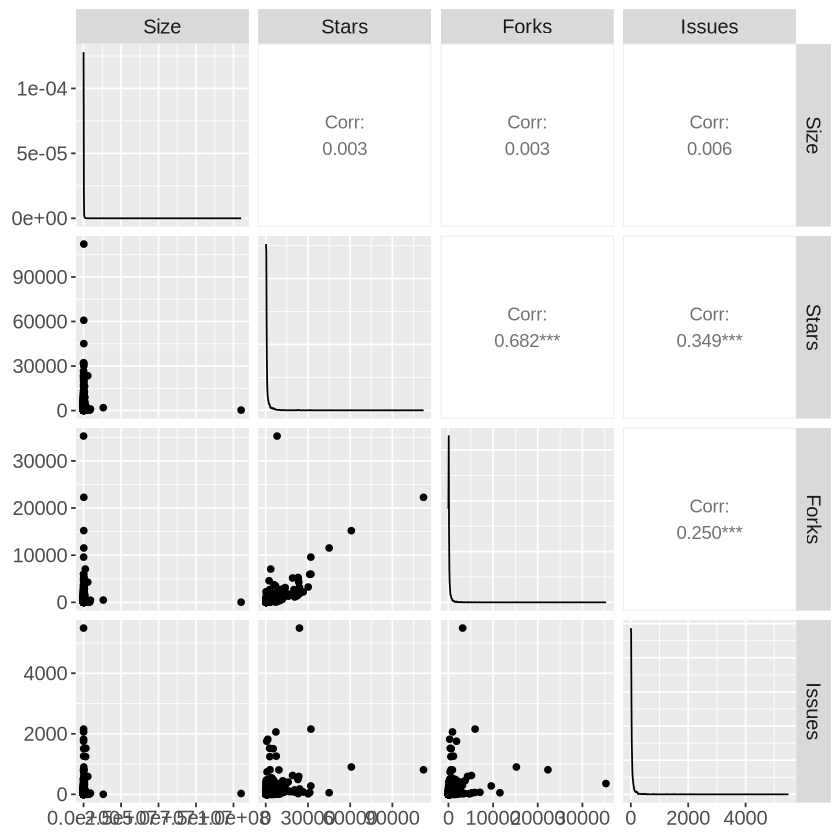

In [4]:
# # generate sample of 2000 observations
repo_sample <- sample_n(repo_tidy, size = 2000, replace = FALSE)
head(repo_sample)

repo_sample_pair_plots <- repo_sample %>%
  select(Size, Stars, Forks, Issues) %>% 
  ggpairs(progress = FALSE) +
  theme(
    text = element_text(size = 15),
    plot.title = element_text(face = "bold"),
    axis.title = element_text(face = "bold")
  )
repo_sample_pair_plots



In [5]:
boxplot1 <- repo_sample %>%
    ggplot(aes(x = Has_Issues, y = Stars)) +
    geom_boxplot() +
        scale_y_log10() 

boxplot

function (x, ...) 
UseMethod("boxplot")
<bytecode: 0x55589b659ad0>
<environment: namespace:graphics>

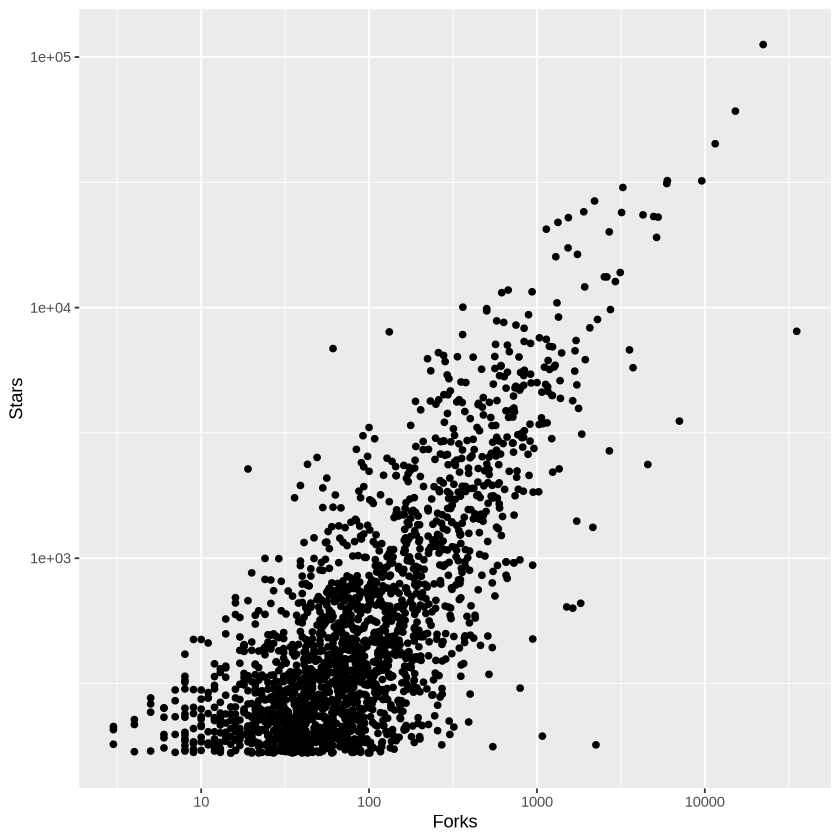

In [6]:
sample_plot <- repo_sample %>%
    ggplot(aes(x = Forks, y = Stars)) +
    geom_point() +
    scale_y_log10() +
    scale_x_log10()
sample_plot

**Table 2:** First six rows of the GitHub repositories dataset.

In [7]:
# Print Table 2
head(repo_raw)


Name,Description,URL,Created At,Updated At,Homepage,Size,Stars,Forks,Issues,⋯,Has Issues,Has Projects,Has Downloads,Has Wiki,Has Pages,Has Discussions,Is Fork,Is Archived,Is Template,Default Branch
<chr>,<chr>,<chr>,<dttm>,<dttm>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<chr>
freeCodeCamp,freeCodeCamp.org's open-source codebase and curriculum. Learn to code for free.,https://github.com/freeCodeCamp/freeCodeCamp,2014-12-24 17:49:19,2023-09-21 11:32:33,http://contribute.freecodecamp.org/,387451,374074,33599,248,⋯,TRUE,TRUE,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,main
free-programming-books,:books: Freely available programming books,https://github.com/EbookFoundation/free-programming-books,2013-10-11 06:50:37,2023-09-21 11:09:25,https://ebookfoundation.github.io/free-programming-books/,17087,298393,57194,46,⋯,TRUE,FALSE,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,main
awesome,😎 Awesome lists about all kinds of interesting topics,https://github.com/sindresorhus/awesome,2014-07-11 13:42:37,2023-09-21 11:18:22,NA,1441,269997,26485,61,⋯,TRUE,FALSE,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,main
996.ICU,Repo for counting stars and contributing. Press F to pay respect to glorious developers.,https://github.com/996icu/996.ICU,2019-03-26 07:31:14,2023-09-21 08:09:01,https://996.icu,187799,267901,21497,16712,⋯,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,TRUE,FALSE,master
coding-interview-university,A complete computer science study plan to become a software engineer.,https://github.com/jwasham/coding-interview-university,2016-06-06 02:34:12,2023-09-21 10:54:48,NA,20998,265161,69434,56,⋯,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,main
public-apis,A collective list of free APIs,https://github.com/public-apis/public-apis,2016-03-20 23:49:42,2023-09-21 11:22:06,http://public-apis.org,5088,256615,29254,191,⋯,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,master


In [8]:
repo_tidy <- repo_raw
names(repo_tidy) <- gsub(" ", "_", names(repo_tidy))
names(repo_tidy)

[1] "Name"            "Description"     "URL"             "Created_At"     
 [5] "Updated_At"      "Homepage"        "Size"            "Stars"          
 [9] "Forks"           "Issues"          "Watchers"        "Language"       
[13] "License"         "Topics"          "Has_Issues"      "Has_Projects"   
[17] "Has_Downloads"   "Has_Wiki"        "Has_Pages"       "Has_Discussions"
[21] "Is_Fork"         "Is_Archived"     "Is_Template"     "Default_Branch"

In [9]:
na_count <- colSums(is.na(repo_raw))
na_count

Name     Description             URL      Created At      Updated At 
              2            8032               0               0               0 
       Homepage            Size           Stars           Forks          Issues 
         136640               0               0               0               0 
       Watchers        Language         License          Topics      Has Issues 
              0           16076           53039               0               0 
   Has Projects   Has Downloads        Has Wiki       Has Pages Has Discussions 
              0               0               0               0               0 
        Is Fork     Is Archived     Is Template  Default Branch 
              0               0               0               0

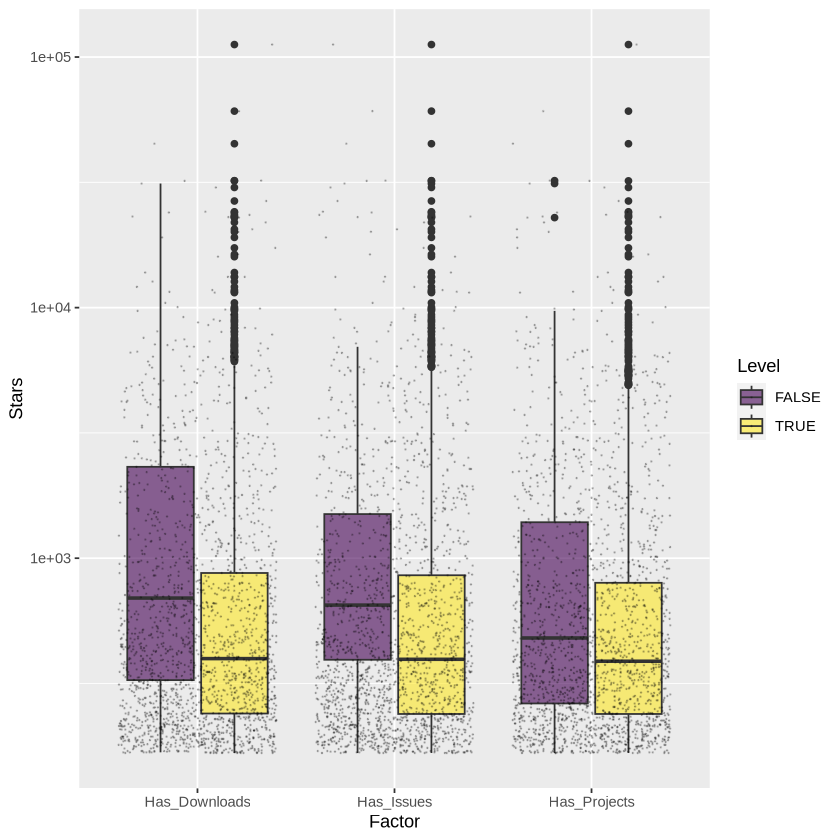

In [14]:
has_issues <- repo_sample %>%
    select(Stars, Has_Issues) %>%
    mutate(Level = Has_Issues, Factor = "Has_Issues") %>%
    select(-Has_Issues)

has_projects <- repo_sample %>%
    select(Stars, Has_Projects) %>%
    mutate(Level = Has_Projects, Factor = "Has_Projects") %>%
    select(-Has_Projects)

has_downloads <- repo_sample %>%
    select(Stars, Has_Downloads) %>%
    mutate(Level = Has_Downloads, Factor = "Has_Downloads") %>%
    select(-Has_Downloads)

combined_rows <- bind_rows(has_issues, has_projects, has_downloads)

# grouped boxplot
ggplot(combined_rows, aes(x=Factor, y=Stars, fill=Level)) + 
    geom_boxplot() +
    scale_fill_viridis(discrete = TRUE, alpha=0.6) +
    geom_jitter(color="black", size=0.1, alpha=0.2) +
    scale_y_log10()


variety,treatment,note
<chr>,<chr>,<int>
A,high,61
A,high,46
A,high,102
A,high,147
A,high,150
A,high,156
A,high,98
A,high,131
A,high,34


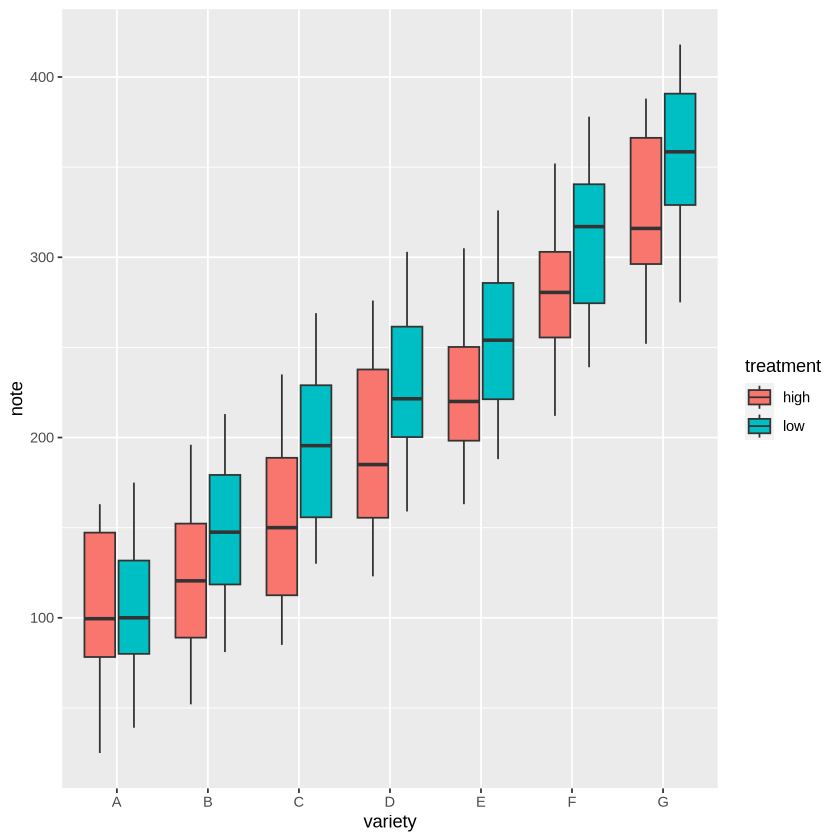

In [11]:
# create a data frame
variety=rep(LETTERS[1:7], each=40)
treatment=rep(c("high","low"),each=20)
note=seq(1:280)+sample(1:150, 280, replace=T)
data=data.frame(variety, treatment ,  note)
data
# grouped boxplot
ggplot(data, aes(x=variety, y=note, fill=treatment)) + 
    geom_boxplot() 
